# Predicting Electrical Grid Stability using Machine Learning
### Prepared by Muhammad N Rafi

## Latar Belakang

Jaringan listrik (Electrical Grid) merupakan infrastruktur yang sangat krusial dan diperlukan monitoring secara kontinyu untuk menjaga kestabilan sistem kelistrikan. Kestabilan jaringan dapat dipengaruhi oleh beberapa faktor diantaranya adalah keseimbangan antara kebutuhan energi dan pasokan energi, frekuensi deviasi, dan elastisitas harga listrik. Biasanya untuk menjaga kestabilan energi masih dilakukan secara manual oleh grid operators, yang mana dapat memakan waktu dan kurang efisien. Dalam beberapa tahun belakangan ini, terdapat terobosan untuk mengembangkan sistem otomatis yang dapat memprediksi perubahan dari kestabilan jaringan listrik, disinlah peran dari machine learning untuk menghasilkan prediksi dari potensi terjadinya perubahan kestabilan energi.

Pada kontek ini, dataset yang digunakan berasal dari Electrical Grid Stability Simulated Data Set dari UCI Machine Learning Repository. Dari dataset ini kita dapat menganalisa hubungan antara input variables seperti nominal power, reaction time, dan price lasticity dengan kestabilan jaringan listrik. Hasil dari analisis ini dapat digunakan untuk mengembangkan sistem yang lebih akurat dan andal dalam memprediksi dan mengelola kestabilan jaringan secara real time.

Source: https://archive.ics.uci.edu/ml/datasets/Electrical+Grid+Stability+Simulated+Data+

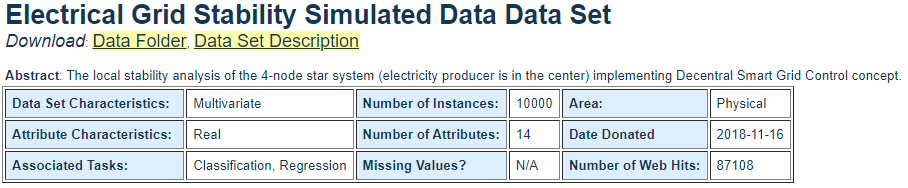

## Tujuan
Tujuan utama dari projek ini adalah untuk mengembangkan machine learning model yang mampu memprediksi dengan akurat kestabilan jaringan listrik berdasarkan input variables di Electrical Grid Stability Simulated Data Set. Serta menjabarkan potensi kegunaan dari machine learning dalam memprediksi kestabilan grid, seperti meningkatkan effisiensi, mengurangi downtime, dan meningkatkan keandalan sistem.

## Metrik Evaluasi
Pada projek ini akan menggunakan ROC AUC sebagai metrik evaluasi, ROC AUC digunakan untuk mengevaluasi seberapa baik model mampu membedakan anatara sistem yang stabil dan tidak stabil berdasarkan variabel input yang diberikan. 

## Informasi Data Set

Dataset ini terdiri dari 11 atribut prediktif, 1 atribut non-prediktif (p1), dan 2 atribut label:

1. tau[x]: waktu reaksi peserta (real dalam rentang [0,5,10] detik). Tau1 - nilai untuk produsen listrik.
2. p[x]: daya nominal yang dikonsumsi(negatif)/dihasilkan(positif)(real). Untuk konsumen, rentangnya adalah [-0,5,-2]s^-2; p1 = abs(p2 + p3 + p4).
3. g[x]: koefisien (gamma) proporsional terhadap elastisitas harga (real dalam rentang [0,05,1]s^-1). g1 - nilai untuk produsen listrik.
4. stab: bagian riil maksimum dari akar persamaan karakteristik (jika positif - sistem tidak stabil secara linear)(real).
5. stabf: label stabilitas sistem (kategori: stabil/tidak stabil).


In [1]:
# Import Library

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import cross_val_predict, train_test_split, StratifiedKFold
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression

from sklearn.preprocessing import LabelEncoder, StandardScaler, MinMaxScaler, OneHotEncoder, OrdinalEncoder, RobustScaler

from sklearn.compose import ColumnTransformer
import category_encoders as ce

from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import cross_val_score, GridSearchCV, RandomizedSearchCV


from imblearn.over_sampling import SMOTE, RandomOverSampler
from imblearn.under_sampling import NearMiss, RandomUnderSampler


from sklearn.metrics import classification_report
from sklearn.metrics import roc_curve, roc_auc_score, plot_roc_curve


from imblearn.pipeline import Pipeline

import warnings
warnings.filterwarnings('ignore')

In [2]:
df = pd.read_csv('Data_for_UCI_named.csv')
df.head()

,tau1,tau2,tau3,tau4,p1,p2,p3,p4,g1,g2,g3,g4,stab,stabf
0,2.959060,3.079885,8.381025,9.780754,3.763085,-0.782604,-1.257395,-1.723086,0.650456,0.859578,0.887445,0.958034,0.055347,unstable
1,9.304097,4.902524,3.047541,1.369357,5.067812,-1.940058,-1.872742,-1.255012,0.413441,0.862414,0.562139,0.781760,-0.005957,stable
2,8.971707,8.848428,3.046479,1.214518,3.405158,-1.207456,-1.277210,-0.920492,0.163041,0.766689,0.839444,0.109853,0.003471,unstable
3,0.716415,7.669600,4.486641,2.340563,3.963791,-1.027473,-1.938944,-0.997374,0.446209,0.976744,0.929381,0.362718,0.028871,unstable
4,3.134112,7.608772,4.943759,9.857573,3.525811,-1.125531,-1.845975,-0.554305,0.797110,0.455450,0.656947,0.820923,0.049860,unstable


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 14 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   tau1    10000 non-null  float64
 1   tau2    10000 non-null  float64
 2   tau3    10000 non-null  float64
 3   tau4    10000 non-null  float64
 4   p1      10000 non-null  float64
 5   p2      10000 non-null  float64
 6   p3      10000 non-null  float64
 7   p4      10000 non-null  float64
 8   g1      10000 non-null  float64
 9   g2      10000 non-null  float64
 10  g3      10000 non-null  float64
 11  g4      10000 non-null  float64
 12  stab    10000 non-null  float64
 13  stabf   10000 non-null  object 
dtypes: float64(13), object(1)
memory usage: 1.1+ MB


Sebelum melakukan analisa terhadap model, alangkah baiknya melakukan pengecekan terhadap isi dari data set yang digunakan. Dari informasi diatas terlihat terdapat total 14 kolom dengan rincian 13 kolom sebagai independent variabel dan 1 kolom sebagai dependent variabel. Total jumlah data adalah sebanyak 10.000 data, dan dari informasi diatas tidak ditemukan data yang hilang (missing values) namun kita perlu melakukan double check untuk memastikan apakah data benar-benar tidak memiliki missing values.


In [4]:
display(df.describe(), df.describe(include='object'))

,tau1,tau2,tau3,tau4,p1,p2,p3,p4,g1,g2,g3,g4,stab
count,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000
mean,5.250000,5.250001,5.250004,5.249997,3.750000,-1.250000,-1.250000,-1.250000,0.525000,0.525000,0.525000,0.525000,0.015731
std,2.742548,2.742549,2.742549,2.742556,0.752160,0.433035,0.433035,0.433035,0.274256,0.274255,0.274255,0.274255,0.036919
min,0.500793,0.500141,0.500788,0.500473,1.582590,-1.999891,-1.999945,-1.999926,0.050009,0.050053,0.050054,0.050028,-0.080760
25%,2.874892,2.875140,2.875522,2.874950,3.218300,-1.624901,-1.625025,-1.624960,0.287521,0.287552,0.287514,0.287494,-0.015557
50%,5.250004,5.249981,5.249979,5.249734,3.751025,-1.249966,-1.249974,-1.250007,0.525009,0.525003,0.525015,0.525002,0.017142
75%,7.624690,7.624893,7.624948,7.624838,4.282420,-0.874977,-0.875043,-0.875065,0.762435,0.762490,0.762440,0.762433,0.044878
max,9.999469,9.999837,9.999450,9.999443,5.864418,-0.500108,-0.500072,-0.500025,0.999937,0.999944,0.999982,0.999930,0.109403


,stabf
count,10000
unique,2
top,unstable
freq,6380


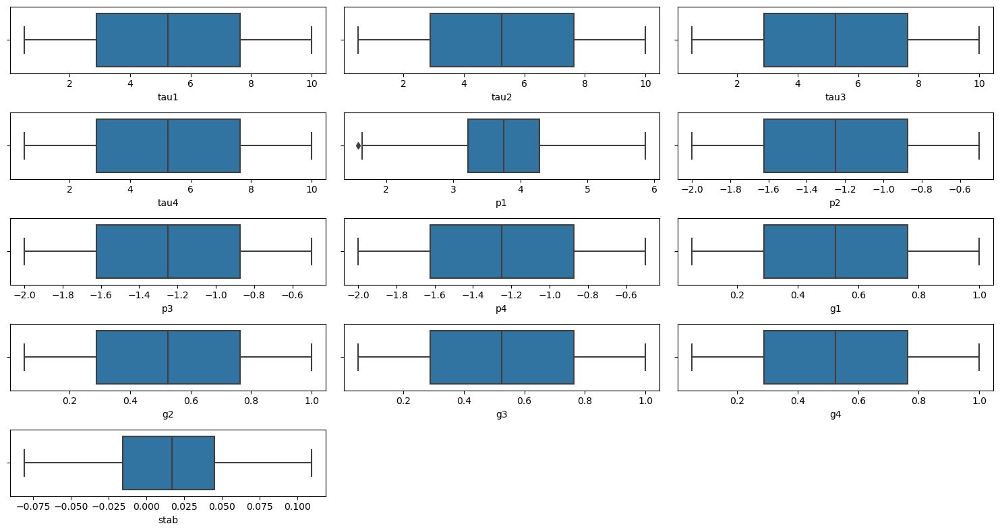

In [5]:
plt.figure(figsize=(15,8))

plotnumber = 1
for kolom in df.describe().columns:

    plt.subplot(5,3, plotnumber)
    sns.boxplot(data=df, x=kolom)

    plotnumber += 1
    
plt.tight_layout()

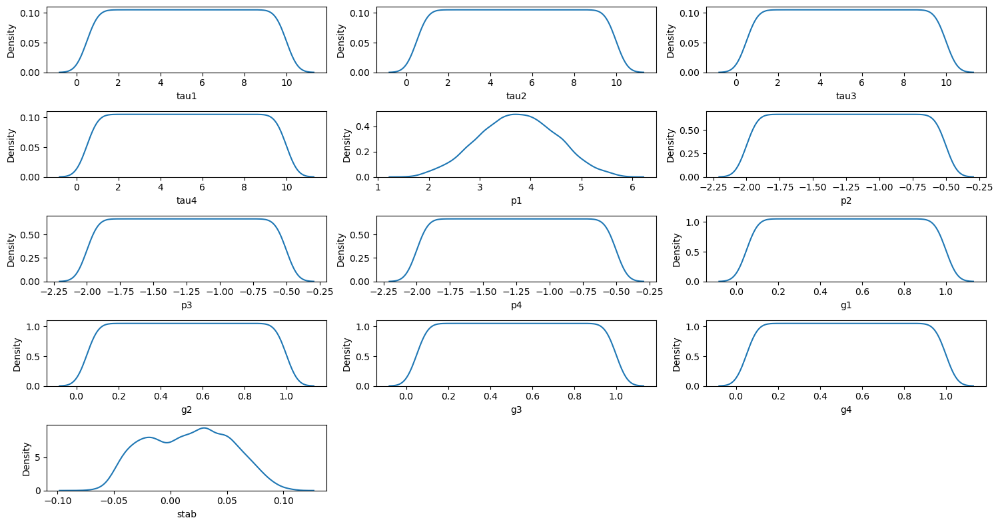

In [6]:
plt.figure(figsize=(15,8))

plotnumber = 1
for kolom in df.describe().columns:

    plt.subplot(5,3, plotnumber)
    sns.kdeplot(data=df, x=kolom)

    plotnumber += 1
    
plt.tight_layout()

Dari informasi diatas didapatkan bahwa data telah terdistribusi secara normal sehingga dengan demikian akan memudahkan dalam proses preprocessing data.

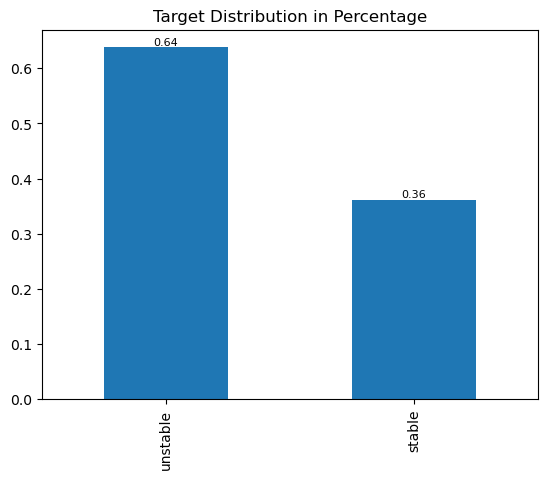

In [7]:
# Distribusi Label
ax = df.stabf.value_counts(normalize=True).plot(kind='bar')
plt.title('Target Distribution in Percentage')

for i in ax.containers:
    ax.bar_label(i, label_type='edge', labels=[f"{x:.2f}" for x in i.datavalues], fontsize=8)

plt.show()

Dari barplot diatas didapatkan bahwa proporsi kedua kelas terlihat tidak seimbang dimana kelas positif dalam hal ini jaringan stabil dan kelas negatif adalah jaringan yang tidak stabil. kelas positif memiliki proporsi sebesar 36% dan kelas negatif memiliki proporsi sebesar 64%.

## Data Preprocessing

In [8]:
df['stabf'] = np.where(df['stabf'] == 'stable', 1, 0)
df.head()

,tau1,tau2,tau3,tau4,p1,p2,p3,p4,g1,g2,g3,g4,stab,stabf
0,2.959060,3.079885,8.381025,9.780754,3.763085,-0.782604,-1.257395,-1.723086,0.650456,0.859578,0.887445,0.958034,0.055347,0
1,9.304097,4.902524,3.047541,1.369357,5.067812,-1.940058,-1.872742,-1.255012,0.413441,0.862414,0.562139,0.781760,-0.005957,1
2,8.971707,8.848428,3.046479,1.214518,3.405158,-1.207456,-1.277210,-0.920492,0.163041,0.766689,0.839444,0.109853,0.003471,0
3,0.716415,7.669600,4.486641,2.340563,3.963791,-1.027473,-1.938944,-0.997374,0.446209,0.976744,0.929381,0.362718,0.028871,0
4,3.134112,7.608772,4.943759,9.857573,3.525811,-1.125531,-1.845975,-0.554305,0.797110,0.455450,0.656947,0.820923,0.049860,0


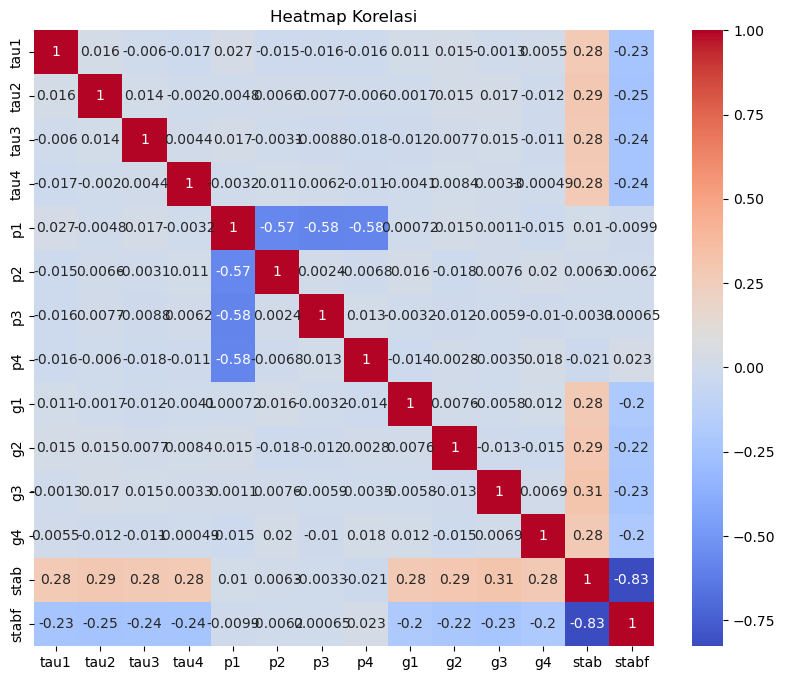

In [9]:
# Menghitung nilai korelasi antar kolom
corr_matrix = df.corr()

# Menggambar heatmap korelasi
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm')
plt.title('Heatmap Korelasi')
plt.show()

Dari informasi diatas dapat ditarik kesimpulan sebagai berikut:

- tau1 (waktu reaksi produsen listrik) memiliki korelasi positif yang lemah dengan stab (maksimal bagian nyata dari akar persamaan karakteristik), menunjukkan bahwa ketika waktu reaksi produsen listrik meningkat, stabilitas sistem juga mungkin meningkat sedikit.

- p1 (daya nominal yang dikonsumsi/diproduksi) memiliki korelasi negatif yang lemah dengan stab, mengindikasikan bahwa ketika daya nominal yang dikonsumsi/diproduksi oleh produsen listrik meningkat, stabilitas sistem mungkin sedikit menurun.

- g1 (koefisien proporsionalitas elastisitas harga untuk produsen listrik) memiliki korelasi negatif yang moderat dengan stab, menunjukkan bahwa ketika koefisien proporsionalitas elastisitas harga untuk produsen listrik meningkat, stabilitas sistem mungkin menurun secara signifikan.

- tau2, tau3, tau4 (waktu reaksi dari tiga konsumen) memiliki korelasi negatif yang lemah dengan stab, menunjukkan bahwa ketika waktu reaksi konsumen meningkat, stabilitas sistem mungkin sedikit menurun.

- p2, p3, p4 (daya nominal yang dikonsumsi oleh tiga konsumen) memiliki korelasi positif yang lemah dengan stab, mengindikasikan bahwa ketika daya nominal yang dikonsumsi oleh konsumen meningkat, stabilitas sistem mungkin sedikit meningkat.

- g2, g3, g4 (koefisien proporsionalitas elastisitas harga untuk tiga konsumen) memiliki korelasi negatif yang lemah dengan stab, menunjukkan bahwa ketika koefisien proporsionalitas elastisitas harga untuk tiga konsumen meningkat, stabilitas sistem mungkin sedikit menurun.

In [19]:
# Quick EDA pakai dataprep
import dataprep
from dataprep.eda import create_report

  0%|                                                                                         | 0/2723 [00:00<…


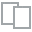
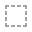
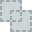
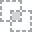
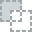
...
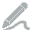
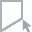
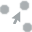
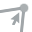
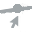

In [21]:
create_report(df).show()

# Modeling

## Split Data

In [11]:
X = df.drop(columns= ['stab', 'stabf'])
y = df['stabf']

In [12]:
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, random_state=2023, test_size=0.2)

In [13]:
display(X_train.shape, y_train.shape)
display(X_test.shape, y_test.shape)

(8000, 12)

(8000,)

(2000, 12)

(2000,)

Disini dilakukan pembagian data menjadi X sebagai independent variable, dan y sebagai dependent variabel. Kedua data ini selanjutnya dibagi lagi menjadi data train dan data test dengan masing masing proporsi sebesar 80% data train dan 20% data test. Penggunaan fungsi stratify adalah untuk memastikan data yang digunakan untuk training model memiliki distribusi kelas yang sama dengan data asli.

In [14]:
X.describe().columns

Index(['tau1', 'tau2', 'tau3', 'tau4', 'p1', 'p2', 'p3', 'p4', 'g1', 'g2',
       'g3', 'g4'],
      dtype='object')

In [15]:
y_train

8639    1
5051    1
435     0
9216    1
5525    1
       ..
5687    0
6458    1
6661    1
5121    0
8261    0
Name: stabf, Length: 8000, dtype: int32

In [16]:
transformer = ColumnTransformer([
    ('scaler', StandardScaler(), ['tau1', 'tau2', 'tau3', 'tau4', 'p1', 'p2', 'p3', 'p4', 'g1', 'g2','g3', 'g4'])
], remainder='passthrough')

transformer

ColumnTransformer(remainder='passthrough',
                  transformers=[('scaler', StandardScaler(),
                                 ['tau1', 'tau2', 'tau3', 'tau4', 'p1', 'p2',
                                  'p3', 'p4', 'g1', 'g2', 'g3', 'g4'])])

`StandardScaler` digunakn untuk melakukan normalisasi pada kolom kolom numerik. Normalisasi dilakukan untuk memastikan bahwa skala dari setiap kolom numerik sama sehingga setiap kolom akan memiliki pengaruh yang setara pada model yang dibangun. Pemilihan StandardScaler dilakukan karena dataset memiliki distribusi data yang normal.

In [17]:
from sklearn.ensemble import GradientBoostingClassifier, AdaBoostClassifier
from lightgbm import LGBMClassifier
from xgboost import XGBClassifier
from sklearn.metrics import roc_curve, roc_auc_score, plot_roc_curve, confusion_matrix
from imblearn.over_sampling import ADASYN

# Models
logreg=LogisticRegression(random_state=2023)
KNN=KNeighborsClassifier(n_neighbors=5)
Tree=DecisionTreeClassifier(random_state=2023)
forest=RandomForestClassifier(random_state=2023)
lgbm=LGBMClassifier(random_state=2023)
gboost=GradientBoostingClassifier(random_state=2023)
adaboost=AdaBoostClassifier(random_state=2023)
xgboost=XGBClassifier(random_state=2023)
SVM = SVC(random_state=2023)

# OverSampling
ros = RandomOverSampler(random_state=2023)
smote = SMOTE(random_state=2023)
adasyn = ADASYN(random_state=2023)

# UnderSampling
rus = RandomUnderSampler(random_state=2023)
nearmiss = NearMiss()

# Kfold
skfold=StratifiedKFold(n_splits=5, shuffle=True, random_state=2023)

In [22]:
# Tanpa Resampling
from sklearn.metrics import balanced_accuracy_score

models = [logreg, Tree, forest, lgbm, gboost, adaboost, xgboost]
score = []
rata = []
std = []
acc = []
rec = []
prec = []
f1 = []
ba = []

for i in models:
    estimator = Pipeline([
        ('preprocess', transformer),
        ('model', i)
    ])
    model_cv = cross_val_score(estimator, X_train, y_train, cv=skfold, scoring='roc_auc')
    score.append(model_cv)
    rata.append(model_cv.mean())
    # std.append(model_cv.std())
    acc_cv = cross_val_score(estimator, X_train, y_train, cv=skfold, scoring='accuracy')
    acc.append(acc_cv.mean())
    rec_cv = cross_val_score(estimator, X_train, y_train, cv=skfold, scoring='recall')
    rec.append(rec_cv.mean())
    prec_cv = cross_val_score(estimator, X_train, y_train, cv=skfold, scoring='precision')
    prec.append(prec_cv.mean())
    f1_cv = cross_val_score(estimator, X_train, y_train, cv=skfold, scoring='f1')
    f1.append(f1_cv.mean())
    ba_cv = cross_val_score(estimator, X_train, y_train, cv=skfold, scoring='balanced_accuracy')
    ba.append(ba_cv.mean())

metrics_df = pd.DataFrame({
    'model': ['Logistic Regression', 'Decision Tree', 'Random Forest', 'LGBM', 'GBoost', 'AdaBoost', 'XGBoost'],
    'mean roc_auc': rata,
    'mean accuracy': acc,
    'mean recall': rec,
    'mean precision': prec,
    'mean f1 score': f1,
    'mean balanced accuracy': ba
}).set_index('model').sort_values(by='mean roc_auc', ascending=False)

metrics_df

,mean roc_auc,mean accuracy,mean recall,mean precision,mean f1 score,mean balanced accuracy
model,,,,,,
XGBoost,0.988954,0.942625,0.903315,0.936155,0.919303,0.934122
LGBM,0.986962,0.938250,0.898827,0.928367,0.913320,0.929723
Random Forest,0.977422,0.916375,0.847028,0.915841,0.879904,0.901373
GBoost,0.976894,0.919250,0.846689,0.923853,0.883551,0.903556
AdaBoost,0.929649,0.843625,0.748272,0.806004,0.776014,0.823000
Logistic Regression,0.889946,0.814375,0.705459,0.763791,0.733454,0.790818
Decision Tree,0.821268,0.835125,0.771064,0.773246,0.771996,0.821268


### Handling Imbalance

Seperti yang sudah kita ketahui sebelumnya bahwa dataset memiliki proporsi kelas positif dan kelas negatif yang tidak seimbang maka kita perlu melakukan pengendalian terhadap ketidakseimbangan proporsi tersebut untuk menghasilkan output yang tidak bias.

In [23]:
df.stabf.value_counts(normalize=True)

0    0.638
1    0.362
Name: stabf, dtype: float64

In [24]:
# Tanpa Resampling
from sklearn.metrics import balanced_accuracy_score

models = [logreg, Tree, forest, lgbm, gboost, adaboost, xgboost]
score = []
rata = []
std = []
acc = []
rec = []
prec = []
f1 = []
ba = []

for i in models:
    estimator = Pipeline([
        ('preprocess', transformer),
        ('resample', ros),
        ('model', i)
    ])
    model_cv = cross_val_score(estimator, X_train, y_train, cv=skfold, scoring='roc_auc')
    score.append(model_cv)
    rata.append(model_cv.mean())
    # std.append(model_cv.std())
    acc_cv = cross_val_score(estimator, X_train, y_train, cv=skfold, scoring='accuracy')
    acc.append(acc_cv.mean())
    rec_cv = cross_val_score(estimator, X_train, y_train, cv=skfold, scoring='recall')
    rec.append(rec_cv.mean())
    prec_cv = cross_val_score(estimator, X_train, y_train, cv=skfold, scoring='precision')
    prec.append(prec_cv.mean())
    f1_cv = cross_val_score(estimator, X_train, y_train, cv=skfold, scoring='f1')
    f1.append(f1_cv.mean())
    ba_cv = cross_val_score(estimator, X_train, y_train, cv=skfold, scoring='balanced_accuracy')
    ba.append(ba_cv.mean())

metrics_df = pd.DataFrame({
    'model': ['Logistic Regression', 'Decision Tree', 'Random Forest', 'LGBM', 'GBoost', 'AdaBoost', 'XGBoost'],
    'mean roc_auc': rata,
    'mean accuracy': acc,
    'mean recall': rec,
    'mean precision': prec,
    'mean f1 score': f1,
    'mean balanced accuracy': ba
}).set_index('model').sort_values(by='mean roc_auc', ascending=False)

metrics_df

,mean roc_auc,mean accuracy,mean recall,mean precision,mean f1 score,mean balanced accuracy
model,,,,,,
XGBoost,0.988469,0.942000,0.916780,0.922647,0.919627,0.936544
LGBM,0.987186,0.937875,0.924722,0.905787,0.915084,0.935029
GBoost,0.977307,0.917500,0.920584,0.861170,0.889861,0.918167
Random Forest,0.976478,0.916125,0.873961,0.892255,0.882927,0.907003
AdaBoost,0.930276,0.847750,0.821819,0.772274,0.796212,0.842140
Logistic Regression,0.889898,0.796500,0.797998,0.689238,0.739600,0.796824
Decision Tree,0.817873,0.833750,0.760354,0.776286,0.768031,0.817873


# Predict

XGBClassifier
Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.96      0.96      1276
           1       0.93      0.92      0.93       724

    accuracy                           0.95      2000
   macro avg       0.94      0.94      0.94      2000
weighted avg       0.95      0.95      0.95      2000

Confusion Matrix:


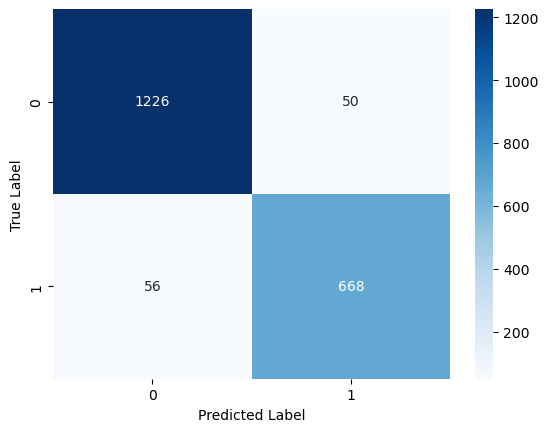

ROC AUC Score: 0.9901496388922565
Balanced Acc: 0.9417334903618004


LGBMClassifier
Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.95      0.96      1276
           1       0.92      0.94      0.93       724

    accuracy                           0.95      2000
   macro avg       0.94      0.94      0.94      2000
weighted avg       0.95      0.95      0.95      2000

Confusion Matrix:


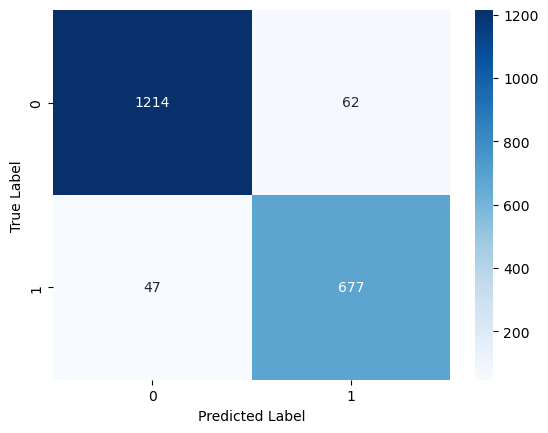

ROC AUC Score: 0.9887824953670828
Balanced Acc: 0.9432467656176935


GradientBoostingClassifier
Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.91      0.93      1276
           1       0.85      0.92      0.89       724

    accuracy                           0.91      2000
   macro avg       0.90      0.92      0.91      2000
weighted avg       0.92      0.91      0.91      2000

Confusion Matrix:


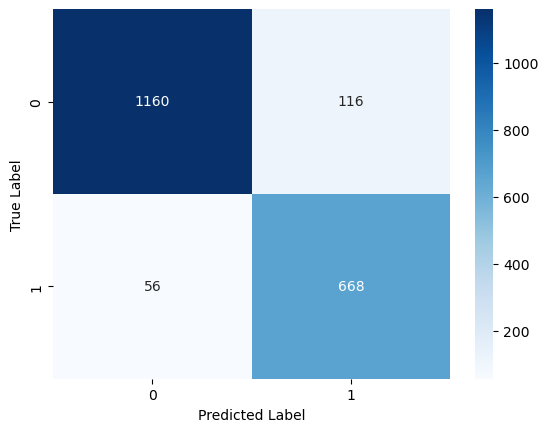

ROC AUC Score: 0.9764635904674484
Balanced Acc: 0.9158714213962833




In [25]:
# Define models
models = [xgboost, lgbm, gboost]

# Loop through models
for model in models:
    # Define pipeline
    estimator = Pipeline([
        ('preprocess', transformer),
        ('resample', ros),
        ('model', model)
    ])
    
    # Fit model and make predictions
    estimator.fit(X_train, y_train)
    y_pred = estimator.predict(X_test)
    y_pred_proba = estimator.predict_proba(X_test)[:, 1]
    
    # Generate evaluation metrics
    print(model.__class__.__name__)
    print('Classification Report:')
    print(classification_report(y_test, y_pred))
    print('Confusion Matrix:')
    sns.heatmap(confusion_matrix(y_test, y_pred), annot=True, cmap='Blues', fmt='d')
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.show()
    print('ROC AUC Score:', roc_auc_score(y_test, y_pred_proba))
    print('Balanced Acc:', balanced_accuracy_score(y_test, y_pred))
    print('\n')

XGBClassifier
Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.96      0.96      1276
           1       0.93      0.92      0.93       724

    accuracy                           0.95      2000
   macro avg       0.94      0.94      0.94      2000
weighted avg       0.95      0.95      0.95      2000

Confusion Matrix:


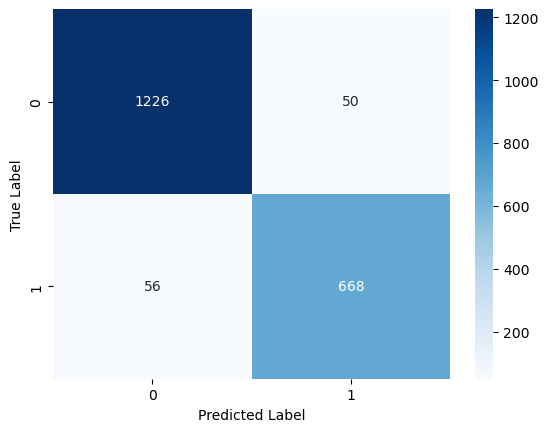

ROC AUC Score: 0.9901496388922565
Balanced Score: 0.9417334903618004




In [26]:
# Define model and pipeline
model = xgboost
estimator = Pipeline([
    ('preprocess', transformer),
    ('resample', ros),
    ('model', model)
])

# Fit model and make predictions
estimator.fit(X_train, y_train)
y_pred = estimator.predict(X_test)
y_pred_proba = estimator.predict_proba(X_test)[:, 1]

# Generate evaluation metrics
print(model.__class__.__name__)
print('Classification Report:')
print(classification_report(y_test, y_pred))
print('Confusion Matrix:')
cm = confusion_matrix(y_test, y_pred)
sns.heatmap(cm, annot=True, cmap='Blues', fmt='d')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()
print('ROC AUC Score:', roc_auc_score(y_test, y_pred_proba))
print('Balanced Score:', balanced_accuracy_score(y_test, y_pred))
print('\n')

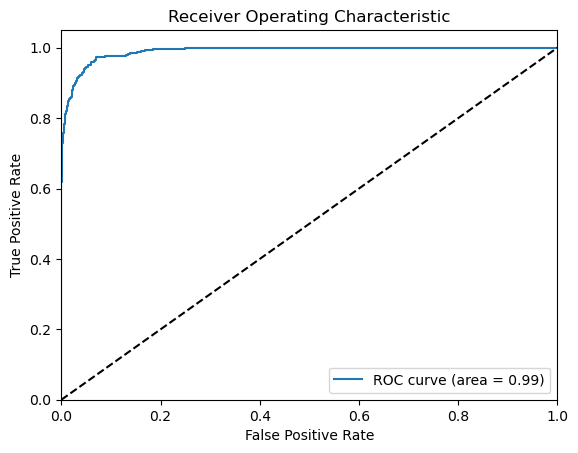

In [27]:
# Import necessary libraries
from sklearn.metrics import roc_curve

# Generate ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)

# Plot ROC curve
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc_score(y_test, y_pred_proba))
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

Berdasarkan hasil ROC AUC didapatkan nilai sebesar 99% yang menandakan bahwa model memiliki akurasi prediksi yang sangat baik dalam mengidentifikasi kesatbilan electrical grid system dengan menggunakan model berbasis algoritma XGBoost Classifier.

Lalu apa sih yang dimaksud dengan XGBoost Classifier?

<img src="https://www.nvidia.com/content/dam/en-zz/Solutions/glossary/data-science/xgboost/img-3.png" width="500" height="500">


XGBoost (Extreme Gradient Boosting) Classifier adalah salah satu jenis model machine learning yang memanfaatkan teknik ensemble learning dengan memadukan banyak pohon keputusan (decision tree) untuk meningkatkan kinerja prediksi.

Cara kerja XGBoost Classifier adalah dengan mengembangkan banyak pohon keputusan secara bertahap (boosting), dimana setiap pohon dibuat untuk memperbaiki kesalahan prediksi pohon sebelumnya. Proses pembuatan pohon dilakukan dengan memilih variabel yang paling penting untuk membagi dataset menjadi dua kelompok yang paling homogen. Pohon-pohon ini kemudian digabungkan untuk menghasilkan prediksi akhir.

Alasan mengapa XGBoost Classifier dapat menghasilkan ROC AUC yang besar adalah karena teknik ensemble learning yang digunakan. Dalam setiap iterasi, model mencoba memperbaiki prediksi sebelumnya dengan menambahkan pohon keputusan baru yang mengambil keputusan berdasarkan variabel yang paling relevan dalam dataset. Seiring bertambahnya jumlah iterasi atau pohon keputusan, performa model semakin meningkat. Selain itu, XGBoost juga memiliki fitur-fitur seperti regularisasi, penalti, dan pruning yang membantu mencegah overfitting, sehingga model dapat menghasilkan prediksi yang lebih akurat pada data yang belum pernah dilihat sebelumnya.

# Feature Importance

In [28]:
estimator['model'].feature_importances_

array([0.12344793, 0.13096632, 0.1253505 , 0.12404694, 0.01999298,
       0.01652768, 0.01687911, 0.01393845, 0.10944314, 0.10518324,
       0.1099515 , 0.1042722 ], dtype=float32)

In [29]:
estimator['preprocess'].get_feature_names_out()

array(['scaler__tau1', 'scaler__tau2', 'scaler__tau3', 'scaler__tau4',
       'scaler__p1', 'scaler__p2', 'scaler__p3', 'scaler__p4',
       'scaler__g1', 'scaler__g2', 'scaler__g3', 'scaler__g4'],
      dtype=object)

In [30]:
df_imp = pd.DataFrame({
    'feature': estimator['preprocess'].get_feature_names_out(),
    'importance': estimator['model'].feature_importances_*100
})

df_imp = df_imp.sort_values('importance', ascending=False)
df_imp

,feature,importance
1,scaler__tau2,13.096632
2,scaler__tau3,12.535050
3,scaler__tau4,12.404694
0,scaler__tau1,12.344793
10,scaler__g3,10.995150
8,scaler__g1,10.944314
9,scaler__g2,10.518324
11,scaler__g4,10.427220
4,scaler__p1,1.999297
6,scaler__p3,1.687911


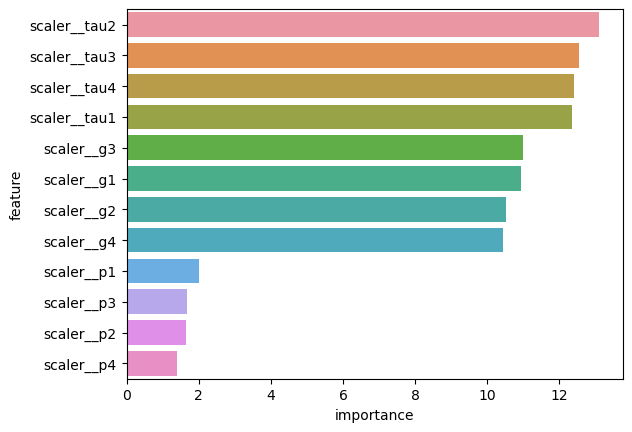

In [31]:
sns.barplot(data=df_imp, x = 'importance', y = 'feature');

Berdasarkan hasil feature importance yang diperoleh dari model yang telah dibuat, dapat dilihat bahwa fitur-fitur yang paling berpengaruh terhadap prediksi stabf adalah fitur-fitur yang memiliki skor importance yang lebih tinggi. Semakin tinggi skor importance suatu fitur, semakin besar pengaruhnya terhadap prediksi stabf.

Berdasarkan urutan skor importance yang tertinggi, dapat disimpulkan bahwa fitur-fitur yang paling berpengaruh dalam memprediksi stabf adalah scaler_tau2, scaler_tau3, scaler_tau4, scaler_tau1, scaler_g3, scaler_g1, scaler_g2, scaler_g4, scaler_p1, scaler_p3, scaler_p2, dan scaler_p4.

Dari fitur-fitur tersebut, dapat dilihat bahwa fitur-fitur yang berkaitan dengan reaction time (tau) dan coefficient proportional to price elasticity (g) memiliki skor importance yang tinggi, sedangkan fitur-fitur yang berkaitan dengan nominal power (p) memiliki skor importance yang lebih rendah. Hal ini menunjukkan bahwa dalam memprediksi stabf, faktor-faktor seperti reaction time dan price elasticity lebih penting daripada faktor nominal power.

# Kesimpulan

Berdasarkan analisis yang telah dilakukan, dapat disimpulkan bahwa: 
- Model yang dihasilkan memiliki ROC AUC score sebesar 0.99, menunjukkan performa yang sangat baik dalam memprediksi stabilitas sistem kelistrikan.

- Variabel-input yang memiliki korelasi kuat dengan stabilitas sistem kelistrikan adalah tau1, p1, dan g1.

- Variabel-input yang memiliki korelasi sedang dengan stabilitas sistem kelistrikan adalah g2.

- Variabel-input yang memiliki korelasi lemah dengan stabilitas sistem kelistrikan adalah tau2, tau3, tau4, p2, p3, p4, g3, dan g4.

Berdasarkan hasil ini, dapat disimpulkan bahwa penggunaan XGBoost Classifier dapat menghasilkan performa yang sangat baik dalam memprediksi stabilitas sistem kelistrikan. Selain itu, variabel-input seperti tau1, p1, dan g1 memiliki pengaruh yang cukup besar terhadap stabilitas sistem, sehingga perlu diperhatikan dalam pengambilan keputusan terkait pengelolaan sistem kelistrikan.